<a href="https://colab.research.google.com/github/peluca13/LDM_Cuadernos/blob/main/VGG19_preEntrenada.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%tensorflow_version 2.7.0
!sudo pip3 install keras

Colab only includes TensorFlow 2.x; %tensorflow_version has no effect.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import tensorflow as tf 
import numpy as np
import os
import pandas as pd
from tensorflow.keras import layers
from tensorflow.keras.layers.experimental import preprocessing
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras.callbacks import TensorBoard      #Observar funcionamiento del modelo
from tensorflow.keras.preprocessing.image import ImageDataGenerator   #Generar imagenes extra
import matplotlib.pyplot as plt
import pathlib

import sklearn.metrics
from tensorflow import keras
from datetime import datetime
import itertools
import io

In [ ]:
BATCH_SIZE = 32
IMG_SIZE = (256, 256)

In [ ]:
PATH='/content/drive/MyDrive/DataSet'
train_dir = os.path.join(PATH, 'train')
test_dir = os.path.join(PATH, 'test')

In [ ]:
train_dataset = image_dataset_from_directory(train_dir,
                                             shuffle=True,
                                             validation_split=0.2,
                                             subset="training",
                                             seed=42,
                                             batch_size=BATCH_SIZE,
                                             image_size=IMG_SIZE)

Found 309 files belonging to 2 classes.
Using 248 files for training.


In [ ]:
class_names = train_dataset.class_names

In [ ]:
class_names

['noPitanga', 'pitanga']

In [ ]:
validation_dataset = image_dataset_from_directory(train_dir,
                                             shuffle=True,
                                             validation_split=0.2,
                                             subset="validation",
                                             seed=42,
                                             batch_size=BATCH_SIZE,
                                             image_size=IMG_SIZE)

Found 309 files belonging to 2 classes.
Using 61 files for validation.


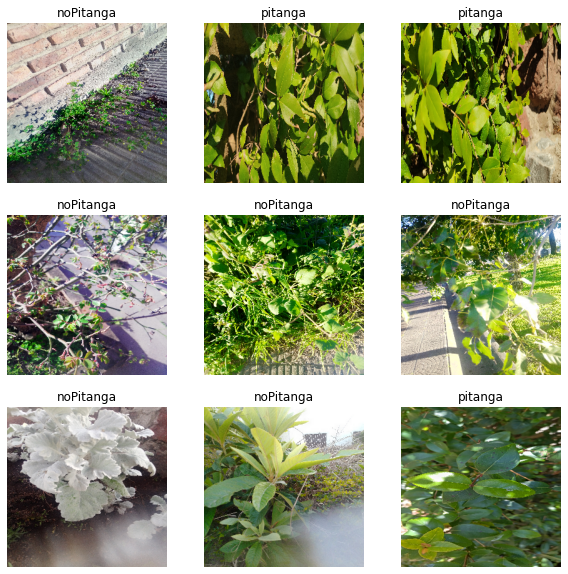

In [ ]:
plt.figure(figsize=(10, 10))
for images, labels in train_dataset.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

In [ ]:
test_dataset = image_dataset_from_directory(test_dir,
                                             batch_size=BATCH_SIZE,
                                             image_size=IMG_SIZE,
                                             )

Found 32 files belonging to 2 classes.


In [ ]:
AUTOTUNE = tf.data.AUTOTUNE
train_dataset = train_dataset.prefetch(buffer_size=AUTOTUNE)
validation_dataset = validation_dataset.prefetch(buffer_size=AUTOTUNE)
test_dataset = test_dataset.prefetch(buffer_size=AUTOTUNE)

**Preprocesado**

In [ ]:
data_augmentation = tf.keras.Sequential(
    [
        preprocessing.RandomFlip("horizontal"),
        preprocessing.RandomFlip("vertical"),
        preprocessing.RandomRotation(0.3),
        preprocessing.RandomZoom(0.5)
    ]
)

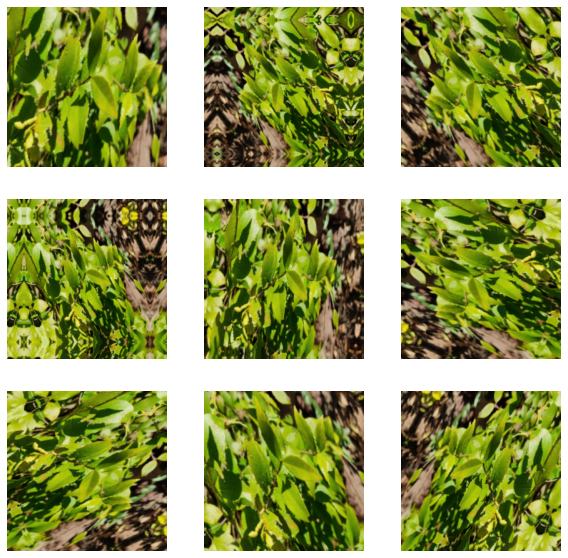

In [ ]:
for image, _ in train_dataset.take(1):
    plt.figure(figsize=(10, 10))
    first_image = image[0]
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        augmented_image = data_augmentation(tf.expand_dims(first_image, 0))
        plt.imshow(augmented_image[0] / 255)
        plt.axis('off')

**Reescalado**

In [ ]:
rescale = preprocessing.Rescaling(1./255)

# Generacion del modelo

Transfer learning con modelo convolucional pre entrenado VGG19

In [ ]:
base_model_vgg19_2=''
base_model_vgg19_2 = tf.keras.applications.vgg19.VGG19(weights = 'imagenet', include_top = False, input_shape = (256,256,3))

In [ ]:
base_model_vgg19_2.trainable = False

In [ ]:
inputs = tf.keras.Input(shape=(256, 256, 3), name='image')
x = data_augmentation(inputs)
x = tf.keras.applications.vgg19.preprocess_input(x)
x = base_model_vgg19_2(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Flatten()(x)
x = layers.Dense(1000, activation='relu')(x)
x = layers.Dropout(.3)(x)
outputs = layers.Dense(1)(x)
model_vgg19_alternativo3 = tf.keras.Model(inputs, outputs, name='vgg19')

In [ ]:
model_vgg19_alternativo3.summary()

Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 image (InputLayer)          [(None, 256, 256, 3)]     0         
                                                                 
 sequential_2 (Sequential)   (None, 256, 256, 3)       0         
                                                                 
 tf.__operators__.getitem_2   (None, 256, 256, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_2 (TFOpLambd  (None, 256, 256, 3)      0         
 a)                                                              
                                                                 
 vgg19 (Functional)          (None, 8, 8, 512)         20024384  
                                                                 
 global_average_pooling2d_2   (None, 512)              0     

In [ ]:
model_vgg19_alternativo3.compile(optimizer=tf.keras.optimizers.Adam(),
              loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [ ]:
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=2, restore_best_weights=True)
callback2=TensorBoard(log_dir='/content/drive/MyDrive/DataSet/Modelos/VGG19/Board')


In [ ]:
model_vgg19_alternativo3.fit(train_dataset,
                    epochs=10,
                    validation_data=validation_dataset,
                    callbacks=[callback,callback2])

Epoch 1/10
8/8 [==============================] - 21s 1s/step - loss: 0.4689 - accuracy: 0.8508 - val_loss: 0.1317 - val_accuracy: 0.9508
Epoch 2/10
8/8 [==============================] - 17s 710ms/step - loss: 0.2637 - accuracy: 0.9153 - val_loss: 0.0890 - val_accuracy: 0.9508
Epoch 3/10
8/8 [==============================] - 17s 725ms/step - loss: 0.1512 - accuracy: 0.9355 - val_loss: 0.0517 - val_accuracy: 0.9836
Epoch 4/10
8/8 [==============================] - 17s 709ms/step - loss: 0.1295 - accuracy: 0.9516 - val_loss: 0.0570 - val_accuracy: 0.9672
Epoch 5/10
8/8 [==============================] - 19s 704ms/step - loss: 0.1351 - accuracy: 0.9556 - val_loss: 0.0737 - val_accuracy: 0.9672


In [ ]:
model_vgg19_alternativo3.evaluate(test_dataset)

1/1 [==============================] - 2s 2s/step - loss: 0.0433 - accuracy: 1.0000


[0.043286681175231934, 1.0]


**Metricas**


TensorBoard


In [ ]:
%load_ext tensorboard
%tensorboard --logdir '/content/drive/MyDrive/DataSet/Modelos/VGG19/Board'

<IPython.core.display.Javascript object>